In [1]:
import os
import numpy as np
import pandas as pd
import glob
import pickle
import seaborn as sns
import time
from tqdm import tqdm
from tqdm import trange
import json
import re


from matplotlib import pyplot
from matplotlib.pyplot import *
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

from numpy.linalg import norm
import scipy
import scipy.io as sio
from scipy.spatial.distance import cosine
import sklearn
from sklearn.model_selection import KFold
from sklearn.cluster import SpectralClustering, AgglomerativeClustering

import multidict
from wordcloud import WordCloud
from textwrap import wrap

from matplotlib import pyplot
from matplotlib.patches import Circle
from matplotlib.ticker import MaxNLocator
from matplotlib.pyplot import *
from IPython.display import set_matplotlib_formats

sys.path.append( os.path.abspath(os.path.join('../factor_analysis/')) )
from algorithm.model import admm

In [2]:
class phenotype_detection():
    
    def __init__(self,  CBCL_variable, factorization):
        
        self.M = factorization['M']
        self.M[np.isnan(self.M)] = 0
        self.W = factorization['W']
        self.Q = factorization['Q']
        self.CBCL_variable = CBCL_variable
        self.question = self.CBCL_variable['CBCL2001_6-18_varname'].values
        
    
    def KMeans_cluster(self, k):
        gamma = np.median(pairwise_distances(self.W, metric='euclidean'))
        kmeans_model = KMeans(n_clusters=k, random_state=1).fit(self.W)
        labels = kmeans_model.labels_
        return labels
    
    def Spectral_clustering(self, k):
        distance_matrix = pairwise_distances(self.W, metric='cosine')
        gamma = np.median(distance_matrix)
        sc = SpectralClustering(k, affinity='rbf', n_init=100, gamma=gamma, assign_labels='discretize')
        sc.fit(self.W)
        return sc.labels_
    
    def NMF_clustering(self):
        labels = np.argmax(self.W, axis=1)
        return labels
    
    def DBSCAN_clustering(self, eps=0.01, min_samples=15):
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(self.W)
        return db.labels_
    
    def Xmeans(self, amount_initial_centers=3, kmax=20):
        import pyclustering
        from pyclustering.cluster import cluster_visualizer
        from pyclustering.cluster.xmeans import xmeans
        from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

        amount_initial_centers = amount_initial_centers
        initial_centers = kmeans_plusplus_initializer(self.W, amount_initial_centers).initialize()
        
        xmeans_instance = xmeans(self.W, initial_centers, kmax)
        xmeans_instance.process()
        # Extract clustering results: clusters and their centers
        clusters = xmeans_instance.get_clusters()
        labels = np.zeros(self.W.shape[0])
        for k in range(len(clusters)):
            labels[clusters[k]] = k
            
        return labels
                    
    def show_wordcloud(self, labels, wordcloud_dir):

        for l in np.unique(labels):
            subj = np.where(labels==l)[0]
            Wgroup = self.W[subj,:]
            group_centroid = np.mean(Wgroup, axis=0)
            question_weight = self.Q[:,:self.W.shape[1]]@group_centroid
            message = self.CBCL_variable[[ 'CBCL2001_6-18_scale', 'CBCL2001_6-18_varname']].values
            
            message_dict = {}
            class_dict = {}
            fullTermsDict = multidict.MultiDict()
            fullClassDict = multidict.MultiDict()
            for k in range(len(message)):
                
                question_class = message[k][0]
                question_abbrev = message[k][1].split('.')[1]              
                message_dict[question_abbrev] = message_dict.get(question_abbrev, 0) + question_weight[k]
                class_dict[question_class] = class_dict.get(question_class, 0) + question_weight[k]
            
            for key in message_dict:
                fullTermsDict.add(key, message_dict[key])   
            for key in class_dict:
                fullClassDict.add(key, class_dict[key])
                
            if np.sum(question_weight < 0) > 0:
                min_val = 0
                for key in list(fullTermsDict.keys()):
                    min_val = np.minimum(min_val, fullTermsDict[key])
                for key in list(fullTermsDict.keys()):
                    fullTermsDict[key] = fullTermsDict[key] - min_val
                    
                min_val = 0
                for key in list(fullClassDict.keys()):
                    min_val = np.minimum(min_val, fullClassDict[key])
                for key in list(fullClassDict.keys()):
                    fullClassDict[key] = fullClassDict[key] - min_val
                
            x, y = np.ogrid[:1000, :1000]
            mask = (x - 500) ** 2 + (y - 500) ** 2 > 480 ** 2
            mask = 255 * mask.astype(int)
            wc = WordCloud(background_color="white", max_words=1000, mask=mask, random_state=1)
            wc.generate_from_frequencies(fullTermsDict)
            
            fig, ax = pyplot.subplots(figsize=(8, 8), constrained_layout=False)
            
            ax.imshow(wc, interpolation="bilinear")
            boundary = Circle((500, 500), 480, color='k', fill=False)
            ax.add_patch(boundary)
            ax.axis("off")
            #ax.set_title('Group {}'.format(l+3))
            fig.savefig(os.path.join(wordcloud_dir, 'group'+str(l+3)+'.png'))
            pyplot.show()
            
            

In [3]:
# CBCL_variable = pd.read_csv( './data/CBCL_variables.csv', index_col=False)

CBCL_question = pd.read_csv('./data/CBCL2001_item_variables_fixed.csv', index_col=False)
CBCL_question = CBCL_question.iloc[:-1,:]
QuestionClass = list(np.unique(CBCL_question['CBCL2001_6-18_scale'].values))
group_index = []
for k in range(CBCL_question.shape[0]):
    qid = CBCL_question.loc[k]['CBCL2001_6-18_varname'].split('.')[0]
    group_index.append(str(QuestionClass.index(CBCL_question.loc[k]['CBCL2001_6-18_scale'])) + '-' + qid)
CBCL_question['group'] = group_index



In [6]:
HBN = pd.read_csv( os.path.join('./data/HBN_20210917.csv' ) )

def hasNumbers(inputString):
    return any(char.isdigit() for char in inputString)

CBCL_column = [c for c in HBN.columns.tolist() if ('CBCL_' in c) & hasNumbers(c) & ('113' not in c)]
CBCL_subscale_T = [c for c in HBN.columns.tolist() if ('CBCL_' in c) & ~hasNumbers(c) & (c[-2:] == ('_T'))]


M = HBN[CBCL_column].values.astype('float')
C = HBN[['Age', 'Sex']].values.astype('float')
min_age = np.min(C[:,0])
max_age = np.max(C[:,0])
C[:,0] = (C[:,0] - np.min(C[:,0]))/( np.max(C[:,0]) - np.min(C[:,0]))
assert(np.sum(np.isnan(C)) == 0)
Cmirror = np.hstack((C, 1-C))
EID = HBN['EID'].values

missdata_mask = 1 - np.isnan(M)
M[np.isnan(M)] = 0
print('Range of data matrix M: [{}, {}]'.format(np.min(M), np.max(M)))




age_counts, age_bins = np.histogram(C[:,0], bins=6, range=(0, 1))
sex_counts = [np.sum(C[:,1]==0), np.sum(C[:,1]==1)]
age_bins = age_bins*(max_age - min_age) + min_age
age_bins = np.round((age_bins[1:] + age_bins[:-1])/2, 1)
sex_bins = ['Male', 'Female']

def demograph_piechart(age_counts, age_bins, sex_counts, sex_bins, model_dir):
    x, y = np.ogrid[:1000, :1000]
    fig, ax = pyplot.subplots(figsize=(8, 8), constrained_layout=False)
    ax.pie(age_counts, labels=age_bins, shadow=False, labeldistance=None,
           startangle=90, textprops={'fontsize': 30})
    ax.text(-0.35, -0.1, 'Age', fontsize=80)
    ax.axis('equal')
    ax.axis("off")
    ax.legend(prop={'size': 20})
    fig.savefig(os.path.join( model_dir, 'wordcloud/group1.png'))
    pyplot.show()

    x, y = np.ogrid[:1000, :1000]
    fig, ax = pyplot.subplots(figsize=(8, 8), constrained_layout=False)
    ax.pie(sex_counts, labels=sex_bins, shadow=False, labeldistance=None,
           startangle=90, textprops={'fontsize': 30})
    ax.text(-0.35, -0.1, 'Sex', fontsize=80)
    ax.axis('equal')
    ax.axis("off")
    ax.legend(prop={'size': 20})
    fig.savefig(os.path.join( model_dir, 'wordcloud/group2.png'))
    pyplot.show()



Range of data matrix M: [0.0, 2.0]


Loss: 3.139e+04: 100%|██████████| 200/200 [01:00<00:00,  3.31it/s]


Max iteration reached


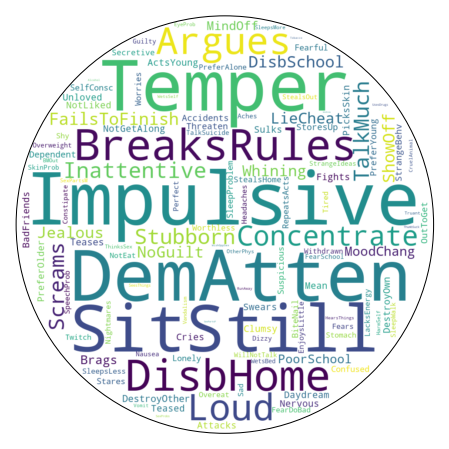

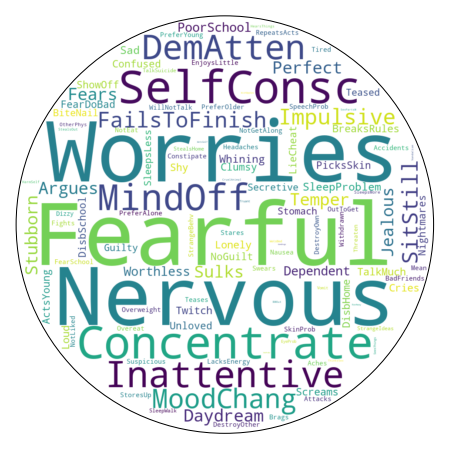

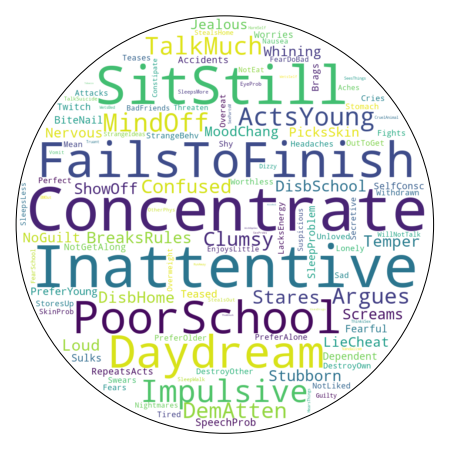

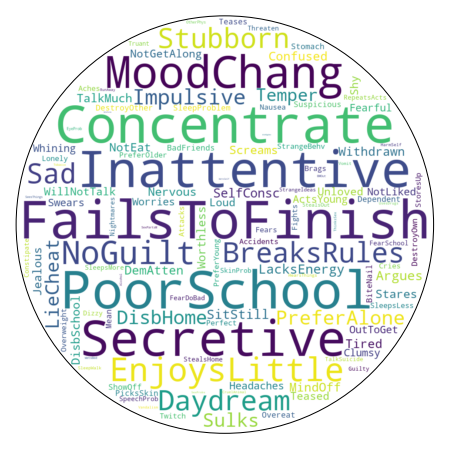

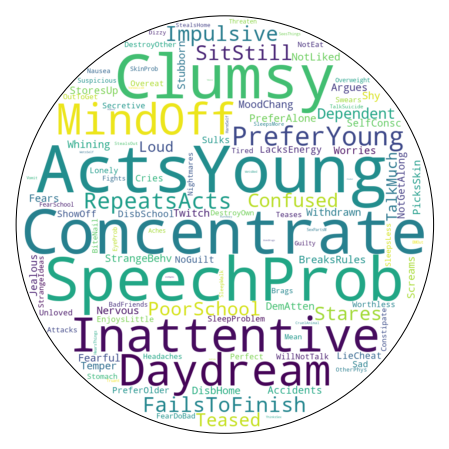

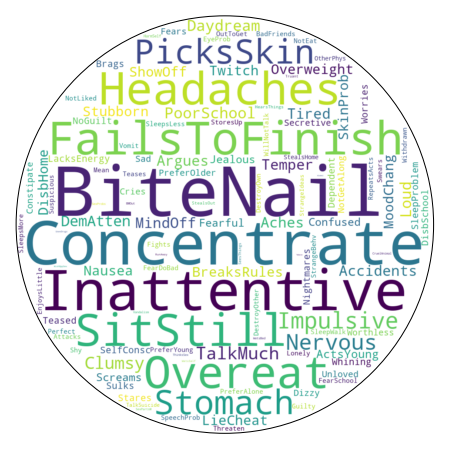

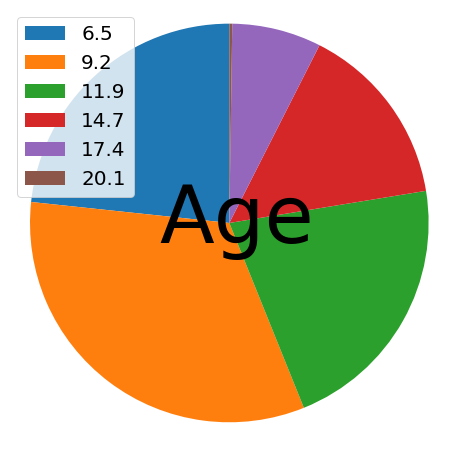

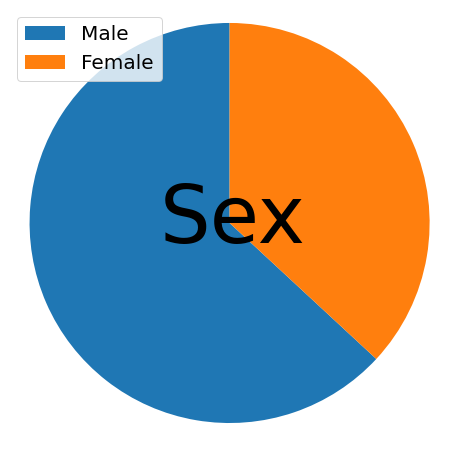

In [7]:
k = 6
beta = 1
rho = 3
tau = 3

W, Q, obj_trend = admm(M, k, beta, C=Cmirror, rho=rho, tau=tau, mask=missdata_mask, Wconstraint=(True, 1), tol=1e-5)

model_name = 'HBN_k{}_Wbdd-20210917'.format(k)

model_dir = './output/factorizations/'+model_name
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
wordcloud_dir = os.path.join( model_dir, 'wordcloud')
if not os.path.exists(wordcloud_dir):
    os.makedirs(wordcloud_dir)
    
np.savez( os.path.join(model_dir, 'factorizations.npz'), W=W, Q=Q, M=M, C=C, EID=EID)

factorization = np.load( os.path.join(model_dir, 'factorizations.npz') )
wordcloud_model = phenotype_detection(CBCL_question, factorization)
labels = wordcloud_model.NMF_clustering()
wordcloud_model.show_wordcloud(labels, os.path.join( model_dir, 'wordcloud'))
demograph_piechart(age_counts, age_bins, sex_counts, sex_bins, model_dir)

# plot_Q(Q, Cmirror, CBCL_question, 'HBN', 'model', Ctitle=['Old', 'Young', 'Male', 'Femal'], show_all=True)

Loss: 3.028e+04:  91%|█████████ | 182/200 [01:17<00:07,  2.36it/s]


Algorithm converged with relative error < 1e-05.


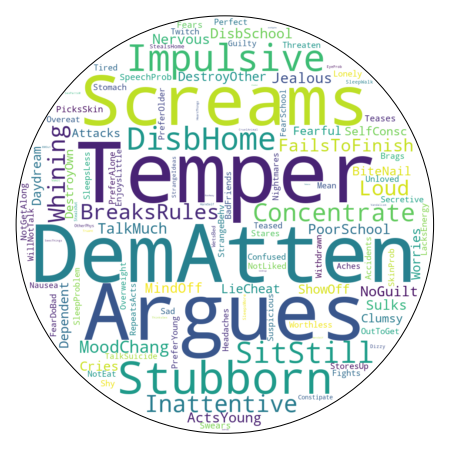

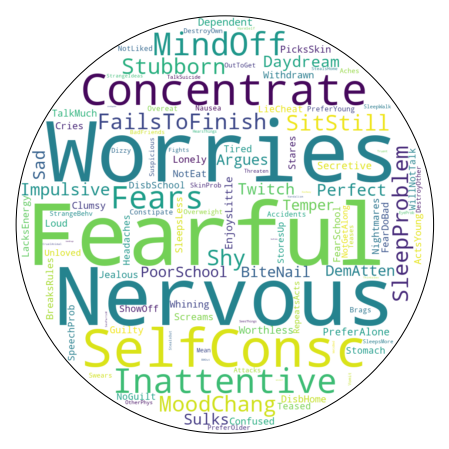

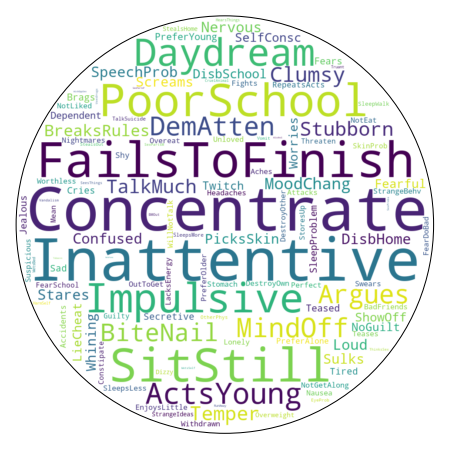

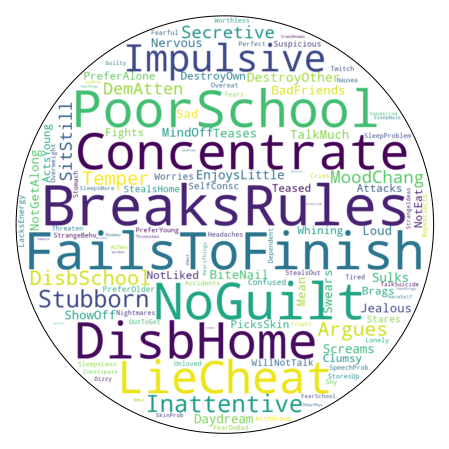

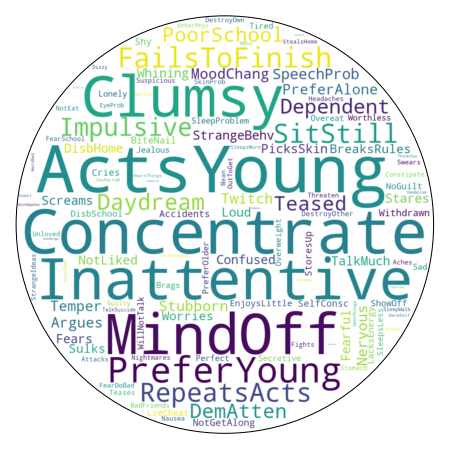

...

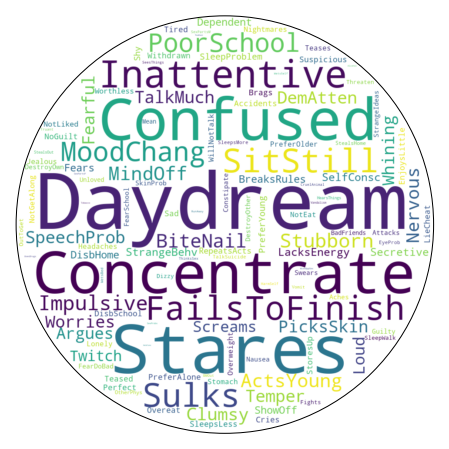

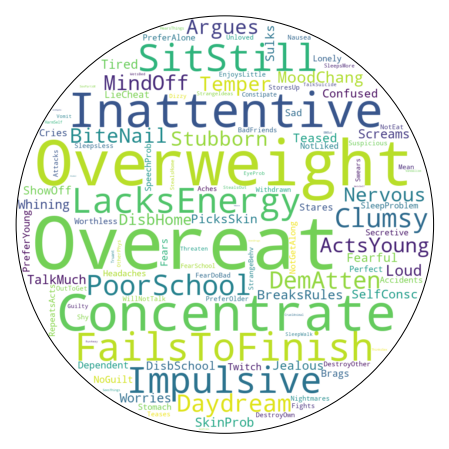

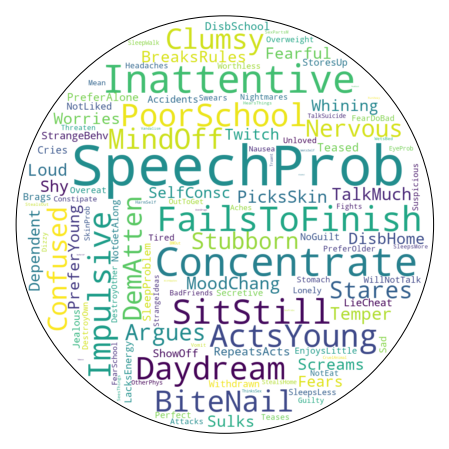

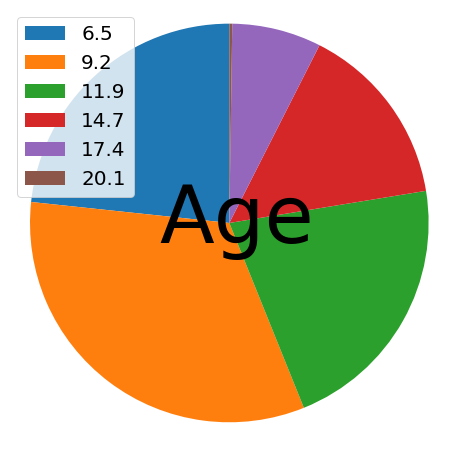

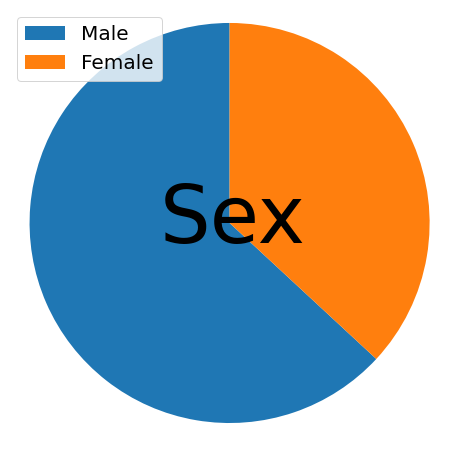

In [8]:
k = 12
beta = 1
rho = 3
tau = 3

W, Q, obj_trend = admm(M, k, beta, C=Cmirror, rho=rho, tau=tau, mask=missdata_mask, Wconstraint=(True, 1), tol=1e-5)


model_name = 'HBN_k{}_Wbdd-20210917'.format(k)

model_dir = './output/factorizations/'+model_name
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
wordcloud_dir = os.path.join( model_dir, 'wordcloud')
if not os.path.exists(wordcloud_dir):
    os.makedirs(wordcloud_dir)
    
np.savez( os.path.join(model_dir, 'factorizations.npz'), W=W, Q=Q, M=M, C=C, EID=EID)

factorization = np.load( os.path.join(model_dir, 'factorizations.npz') )
wordcloud_model = phenotype_detection(CBCL_question, factorization)
labels = wordcloud_model.NMF_clustering()
wordcloud_model.show_wordcloud(labels, os.path.join( model_dir, 'wordcloud'))
demograph_piechart(age_counts, age_bins, sex_counts, sex_bins, model_dir)

# plot_Q(Q, Cmirror, CBCL_question, 'HBN', 'model', Ctitle=['Old', 'Young', 'Male', 'Femal'], show_all=True)

Loss:   0%|          | 0/200 [00:00<?, ?it/s]/mnt_homes/home4T3/lamk5/mlt-external/factor_analysis/algorithm/model.py:160: RuntimeWarning: invalid value encountered in true_divide
  idx = np.where(np.abs(prev_obj[idx] - obj)/np.abs(obj) > tol)[0]
/mnt_homes/home4T3/lamk5/mlt-external/factor_analysis/algorithm/model.py:160: RuntimeWarning: divide by zero encountered in true_divide
  idx = np.where(np.abs(prev_obj[idx] - obj)/np.abs(obj) > tol)[0]
/mnt_homes/home4T3/lamk5/mlt-external/factor_analysis/algorithm/model.py:197: RuntimeWarning: invalid value encountered in true_divide
  idx = np.where(np.abs(prev_obj[idx] - obj)/np.abs(obj) > tol)[0]
Loss: 3.103e+04: 100%|██████████| 200/200 [01:02<00:00,  3.21it/s]


Max iteration reached


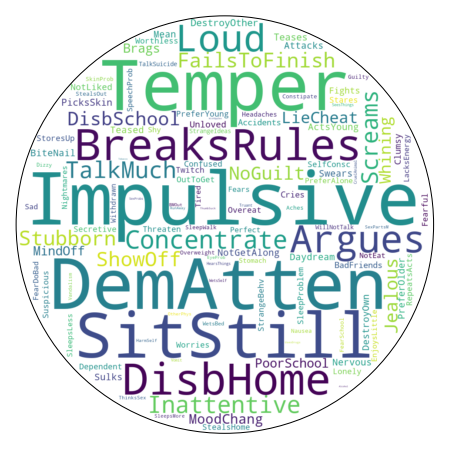

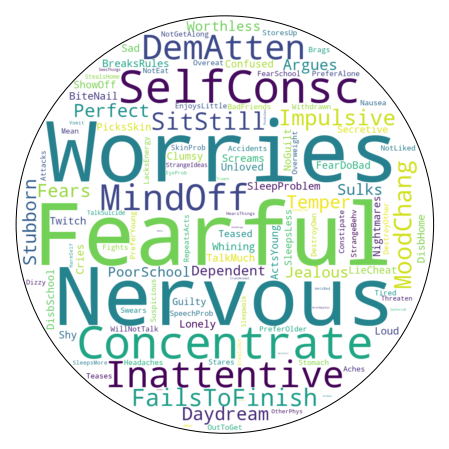

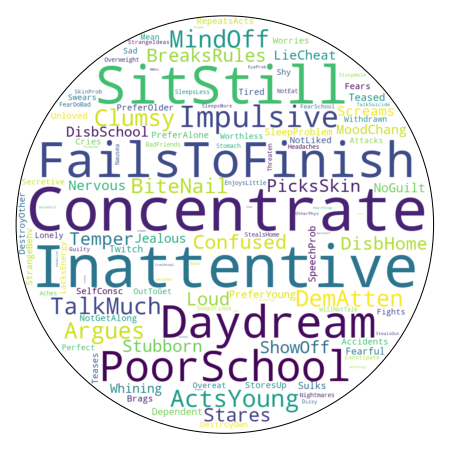

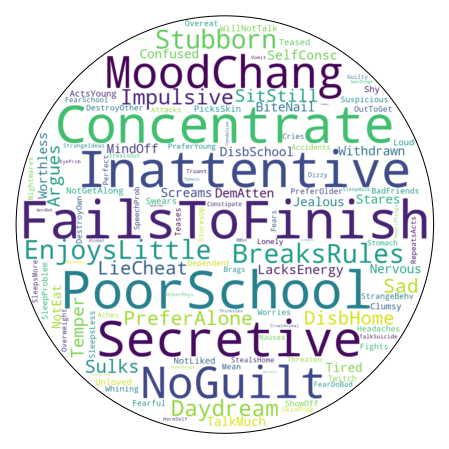

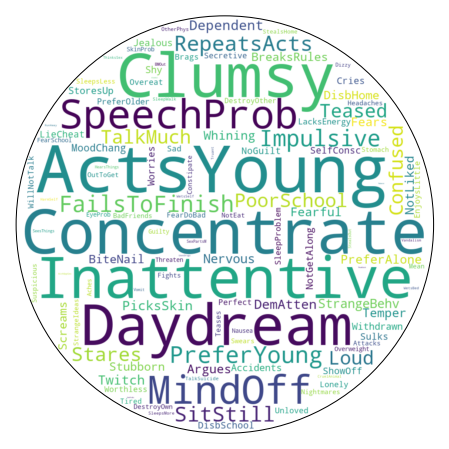

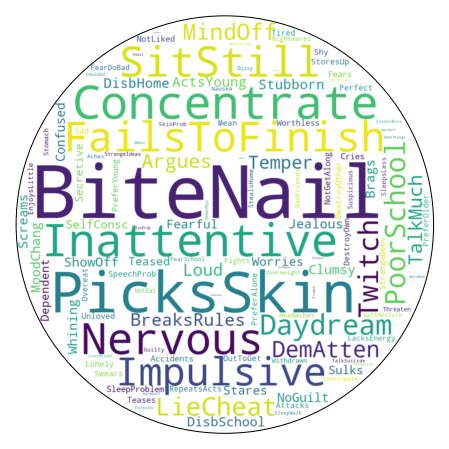

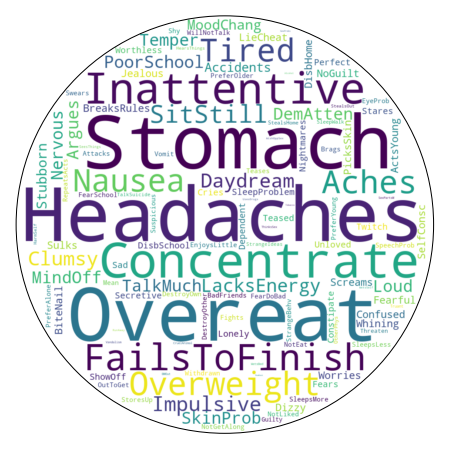

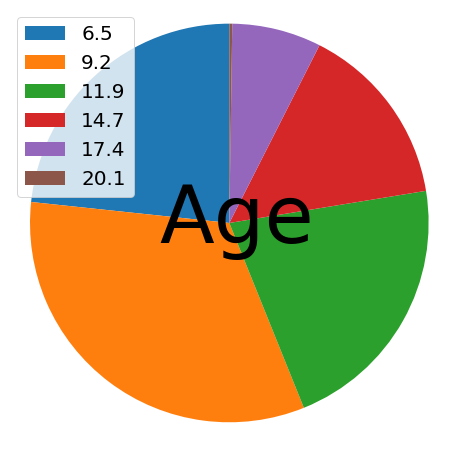

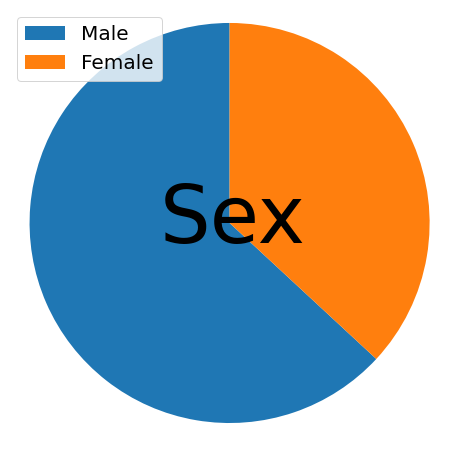

In [10]:
k = 7
beta = 1
rho = 3
tau = 3

W, Q, obj_trend = admm(M, k, beta, C=Cmirror, rho=rho, tau=tau, mask=missdata_mask, Wconstraint=(True, 1), tol=1e-5)


model_name = 'HBN_k{}_Wbdd-20210917'.format(k)

model_dir = './output/factorizations/'+model_name
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
wordcloud_dir = os.path.join( model_dir, 'wordcloud')
if not os.path.exists(wordcloud_dir):
    os.makedirs(wordcloud_dir)
    
np.savez( os.path.join(model_dir, 'factorizations.npz'), W=W, Q=Q, M=M, C=C, EID=EID)

factorization = np.load( os.path.join(model_dir, 'factorizations.npz') )
wordcloud_model = phenotype_detection(CBCL_question, factorization)
labels = wordcloud_model.NMF_clustering()
wordcloud_model.show_wordcloud(labels, os.path.join( model_dir, 'wordcloud'))
demograph_piechart(age_counts, age_bins, sex_counts, sex_bins, model_dir)

# plot_Q(Q, Cmirror, CBCL_question, 'HBN', 'model', Ctitle=['Old', 'Young', 'Male', 'Femal'], show_all=True)

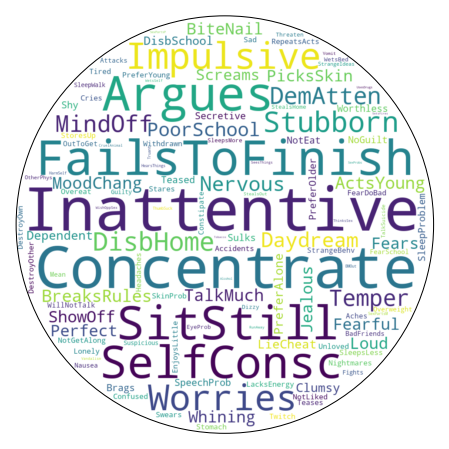

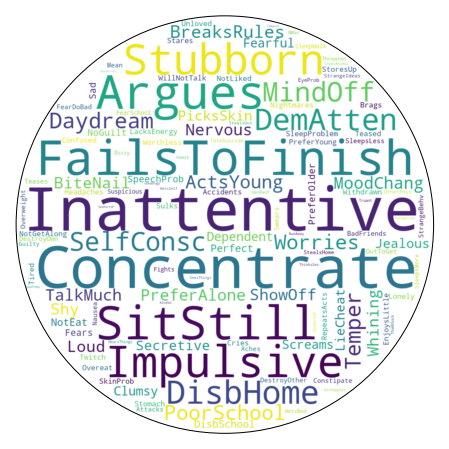

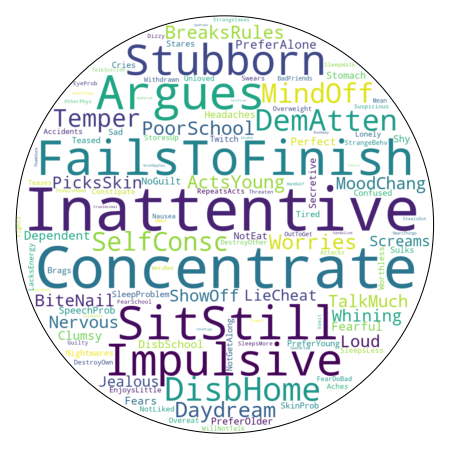

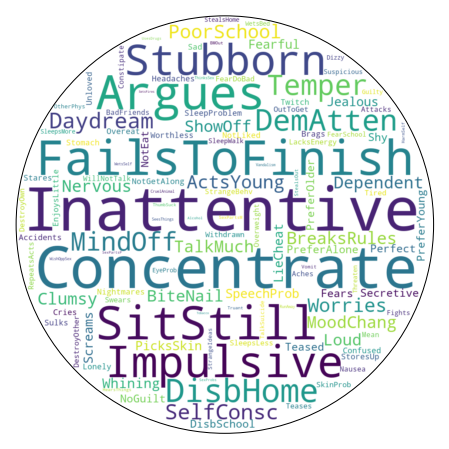

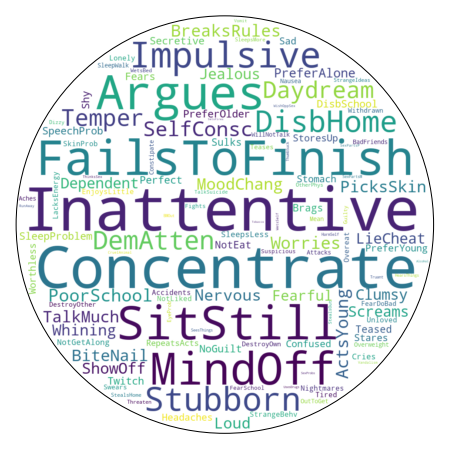

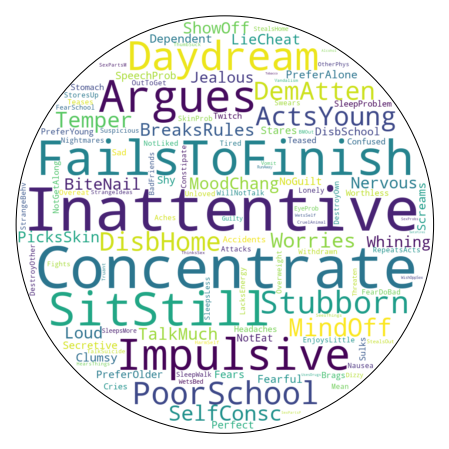

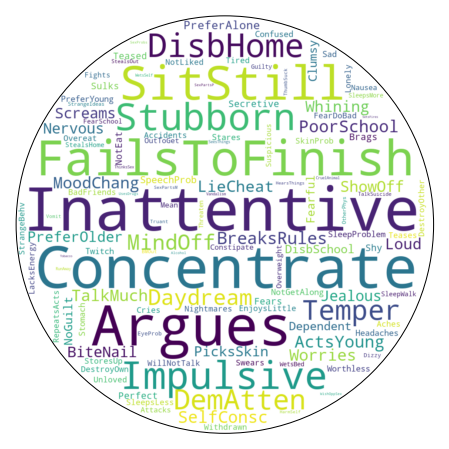

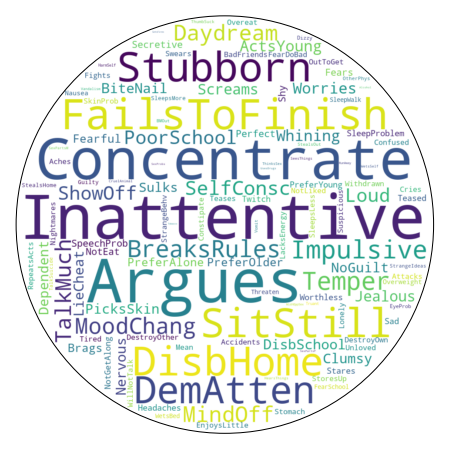

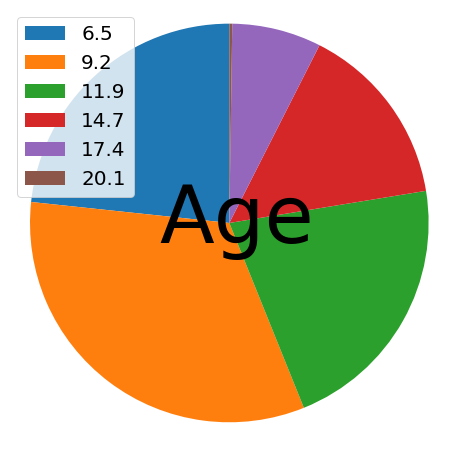

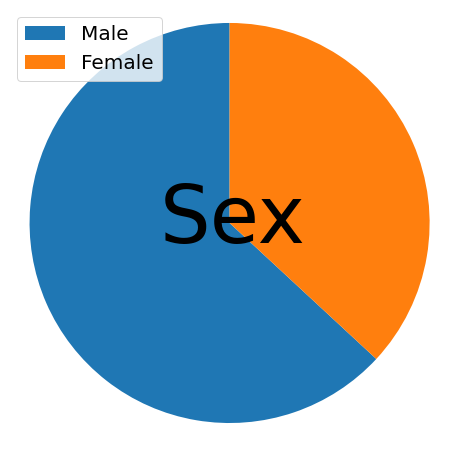

In [11]:
W = HBN[CBCL_subscale_T[:8]].values.astype('float')
inds = np.where(np.isnan(W))
W[inds] = np.take(np.nanmean(W, axis=0), inds[1])

from cvxopt import matrix, solvers
solvers.options['show_progress'] = False

def nnQPsolver(H, f, upperbound):
    P = matrix(H)
    q = matrix(f)
    if upperbound[0] == False:
        G = matrix( -np.eye(H.shape[1]) )
        h = matrix( np.zeros(H.shape[1]) )
    elif upperbound[0] == True:
        G = matrix( np.vstack((-np.eye(H.shape[1]), np.eye(H.shape[1]))) )
        h = matrix( np.hstack((np.zeros(H.shape[1]), upperbound[1]*np.ones(H.shape[1]) )) )
    sol = solvers.qp(P,q,G,h)
    return np.array(sol['x']).flatten()

k = W.shape[1]
Q = np.zeros((M.shape[1], k))
H = (W.T)@W
for j in range(M.shape[1]):
    f = -( np.nan_to_num(M[:,j])@W )
    Q[j,:] = nnQPsolver(H, f, upperbound=(False, 1))
    
W = W / (np.ones(W.shape[1])*100)[None,:]

model_name = 'HBN_subscaleT-20210917'

model_dir = './output/factorizations/'+model_name
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
wordcloud_dir = os.path.join( model_dir, 'wordcloud')
if not os.path.exists(wordcloud_dir):
    os.makedirs(wordcloud_dir)
    
np.savez( os.path.join(model_dir, 'factorizations.npz'), W=W, Q=Q, M=M, C=C, EID=EID)

factorization = np.load( os.path.join(model_dir, 'factorizations.npz') )
wordcloud_model = phenotype_detection(CBCL_question, factorization)
labels = wordcloud_model.NMF_clustering()
wordcloud_model.show_wordcloud(labels, os.path.join( model_dir, 'wordcloud'))
demograph_piechart(age_counts, age_bins, sex_counts, sex_bins, model_dir)
